# Faster R-CNN

- Example with Simpson
- Using implementation by tensorpack

# Install Dependencies

In [1]:
import tensorflow as tf
tf.__version__

'2.12.0'

In [2]:
!pip install --upgrade git+https://github.com/tensorpack/tensorpack.git;

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorpack/tensorpack.git to /tmp/pip-req-build-wyu7r8uu
  Running command git clone --filter=blob:none --quiet https://github.com/tensorpack/tensorpack.git /tmp/pip-req-build-wyu7r8uu
  Resolved https://github.com/tensorpack/tensorpack.git to commit a9a2660d9ebe8fe4f32693b59f1e003687716d81
  Preparing metadata (setup.py) ... done
  Created wheel for tensorpack: filename=tensorpack-0.11-py2.py3-none-any.whl size=296926 sha256=1445a6703152a2ee221f9dee8119025a4e1e9f5ff7a57025310ab51c7e564b7a
  Stored in directory: /tmp/pip-ephem-wheel-cache-qow3pshe/wheels/1e/bf/9a/7768a163ff109c28007e2ac1618cce55158af08a6d6ab7314e
Successfully built tensorpack


# Get example code

Note:

- The origial code is from `tensorpack`'s github
- This code is just a forked/updated version to demonstrate the simpson's example

In [3]:
!git clone --single-branch --branch experiment https://github.com/produdez/tensorpack-faster-rcnn.git
!ls
%cd tensorpack-faster-rcnn
!ls

Cloning into 'tensorpack-faster-rcnn'...
remote: Enumerating objects: 266, done.
remote: Counting objects: 100% (81/81), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 266 (delta 16), reused 19 (delta 8), pack-reused 185
Receiving objects: 100% (266/266), 98.84 KiB | 464.00 KiB/s, done.
Resolving deltas: 100% (163/163), done.
sample_data  tensorpack-faster-rcnn
/content/tensorpack-faster-rcnn
BALLOON.md  config.py	data.py  eval.py   NOTES.md    README.md  utils
common.py   convert_d2	dataset  modeling  predict.py  train.py   viz.py


In [4]:
# !git reset --hard HEAD
# !git pull

# Get dataset

In [5]:
from google.colab import files
files.upload();

Saving kaggle.json to kaggle.json


In [6]:
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

rm: cannot remove '/root/.kaggle': No such file or directory


In [7]:
!ls ~/.kaggle

kaggle.json


In [8]:
!mkdir -p ./data/
!kaggle datasets download -d alexattia/the-simpsons-characters-dataset --path ./data

100% 1.08G/1.08G [00:58<00:00, 24.0MB/s]
100% 1.08G/1.08G [00:58<00:00, 19.8MB/s]


In [9]:
!ls ./data
!unzip -q ./data/the-simpsons-characters-dataset.zip -d ./data/simpson/


the-simpsons-characters-dataset.zip


In [10]:
!ls ./data/simpson

annotation.txt		     kaggle_simpson_testset  simpsons_dataset
characters_illustration.png  number_pic_char.csv     weights.best.hdf5


# Parse dataset
see `dataset/parse_simpson.py` for more info

In [11]:
!python -m dataset.parse_simpson --validation-size 0.5

2023-05-12 03:12:08.092081: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Number of training classes limit: 99
Training size: 0.5
Classes count: 19
Train size: 4723, validation size: 2021


# Get weight
From http://models.tensorpack.com/

In [12]:
!wget -q -nc http://models.tensorpack.com/FasterRCNN/COCO-MaskRCNN-R50FPN2x.npz

# Compatibility

In [13]:
import tensorflow as tf
tf.compat.v1.disable_v2_behavior()
print('activated compat mode')

Instructions for updating:
non-resource variables are not supported in the long term


activated compat mode


# Train simpson

In [14]:
# MODE_MASK false cause we're training bbox only

!python ./train.py --config DATA.BASEDIR=./data/simpson MODE_FPN=True \
  MODE_MASK=False\
	TRAIN.STEPS_PER_EPOCH=1000 \
	"DATA.VAL=('simpson_val',)"  "DATA.TRAIN=('simpson_train',)" \
	TRAIN.BASE_LR=1e-1 TRAIN.EVAL_PERIOD=0 "TRAIN.LR_SCHEDULE=[800]" \
	"PREPROC.TRAIN_SHORT_EDGE_SIZE=[600,1200]" TRAIN.CHECKPOINT_PERIOD=1 DATA.NUM_WORKERS=1 \
	--load COCO-MaskRCNN-R50FPN2x.npz --logdir train_log/simpson

2023-05-12 03:12:26.910567: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
[0512 03:12:28 @logger.py:92] Argv: ./train.py --config DATA.BASEDIR=./data/simpson MODE_FPN=True MODE_MASK=False TRAIN.STEPS_PER_EPOCH=1000 DATA.VAL=('simpson_val',) DATA.TRAIN=('simpson_train',) TRAIN.BASE_LR=1e-1 TRAIN.EVAL_PERIOD=0 TRAIN.LR_SCHEDULE=[800] PREPROC.TRAIN_SHORT_EDGE_SIZE=[600,1200] TRAIN.CHECKPOINT_PERIOD=1 DATA.NUM_WORKERS=1 --load COCO-MaskRCNN-R50FPN2x.npz --logdir train_log/simpson
[0512 03:12:29 @train.py:48] Environment Information:
-----------------------  --------------------------------------------------------------------------------------
sys.platform             linux
Python                   3.10.11 (main, Apr  5 2023, 14:15:10) [GCC 9.4.0]
Tensorpack               v0.11-15-ga9a2660d-dirty @/usr/local/lib/python3.10/dist-packages/tensorpack
Numpy                    1.22.4
TensorFlow               2.12.0/v2.12.0-rc1-12-g0db597d0d75 @/u

# Test results

Copy random images from test set to a folder

In [15]:
import shutil
import os
import json
import random

json_file = os.path.join('./data/simpson', "annotations.json")
with open(json_file) as f:
    obj = json.load(f)

classes_id = obj['classes']['mapping'].values()
TEST_NUM = 3
test_counter = {class_id: TEST_NUM for class_id in classes_id}

test_destination = './data/simpson/sample_test_selections/'
if not os.path.isdir(test_destination): os.mkdir(test_destination)

images = obj['val']
random.shuffle(images)

for roidb in images:
  filepath = roidb['file_name']
  class_id = int(roidb['class'][0])
  if test_counter[class_id] > 0:
    test_counter[class_id] -= 1
    
    classname, filename = filepath.split('/')[-2:]
    newfilename = f'{classname}_{filename}'
    new_destination = os.path.join(test_destination, newfilename)
    shutil.copy(filepath, new_destination)

print('total test images: ', len(os.listdir(test_destination)))

total test images:  24


predict the whole folder

In [16]:
!python ./predict.py --config DATA.BASEDIR=./data/simpson MODE_FPN=True MODE_MASK=False \
	"DATA.VAL=('simpson_val',)"  "DATA.TRAIN=('simpson_train',)" \
	--load train_log/simpson/checkpoint --predict-folder {test_destination}

2023-05-12 03:48:42.182584: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
[0512 03:48:47 @config.py:322] Config: ------------------------------------------
{'BACKBONE': {'FREEZE_AFFINE': False,
              'FREEZE_AT': 2,
              'NORM': 'FreezeBN',
              'RESNET_NUM_BLOCKS': [3, 4, 6, 3],
              'STRIDE_1X1': False,
              'TF_PAD_MODE': False,
              'WEIGHTS': ''},
 'CASCADE': {'BBOX_REG_WEIGHTS': [[10.0, 10.0, 5.0, 5.0], [20.0, 20.0, 10.0, 10.0],
                                  [30.0, 30.0, 15.0, 15.0]],
             'IOUS': [0.5, 0.6, 0.7]},
 'DATA': {'ABSOLUTE_COORD': True,
          'BASEDIR': './data/simpson',
          'CLASS_NAMES': ['BG', 'abraham_grampa_simpson', 'apu_nahasapeemapetilon', 'bart_simpson',
                          'charles_montgomery_burns', 'chief_wiggum', 'comic_book_guy',
                          'edna_krabappel', 'homer_simpson', 'kent_brockman', 'krusty_the_clown',

test results

------------------------
F:  ned_flanders_pic_0776.jpg.png


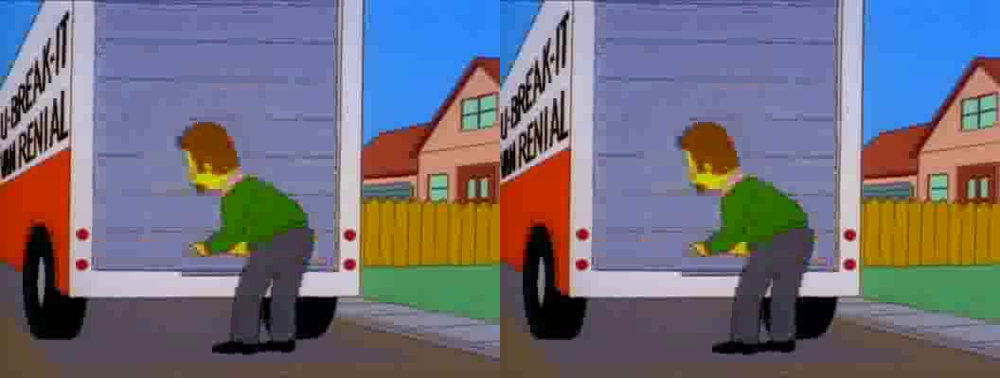

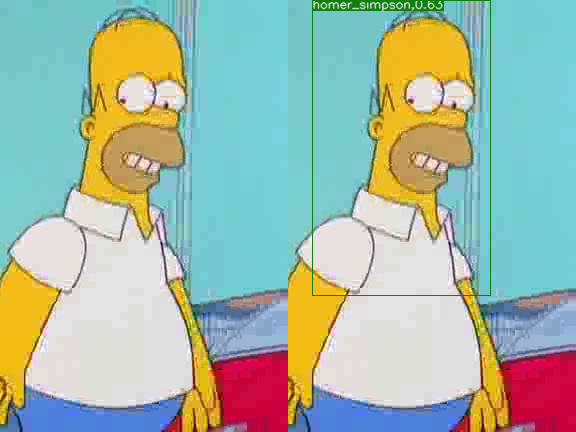

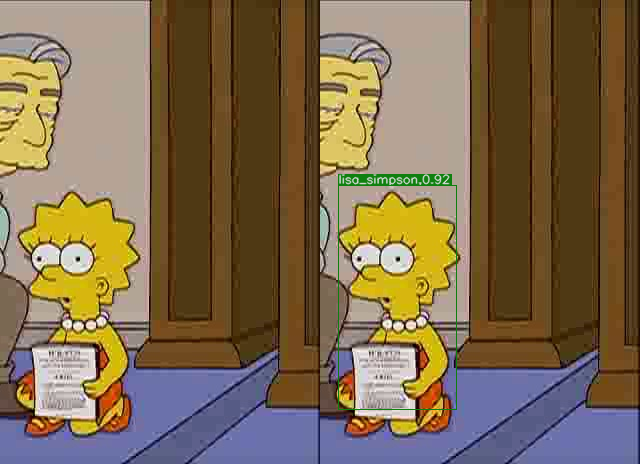

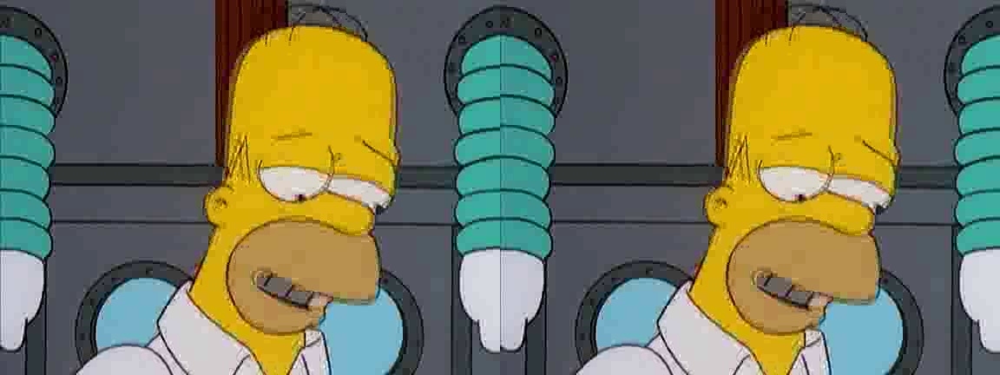

------------------------
F:  homer_simpson_pic_0558.jpg.png
------------------------
F:  lisa_simpson_pic_1204.jpg.png
------------------------
F:  homer_simpson_pic_0024.jpg.png
------------------------
F:  marge_simpson_pic_0557.jpg.png


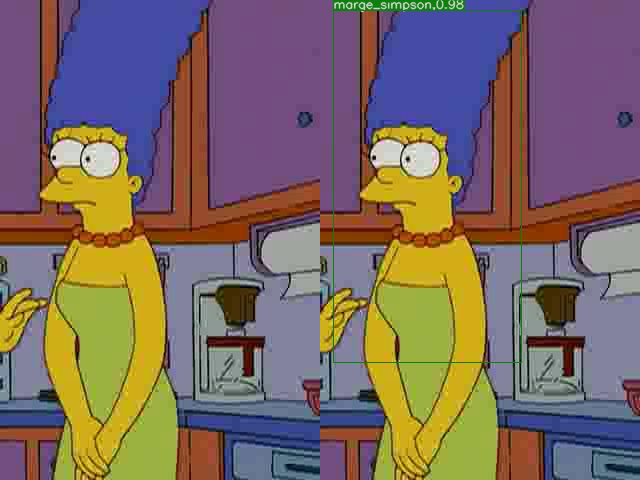

------------------------
F:  principal_skinner_pic_0408.jpg.png


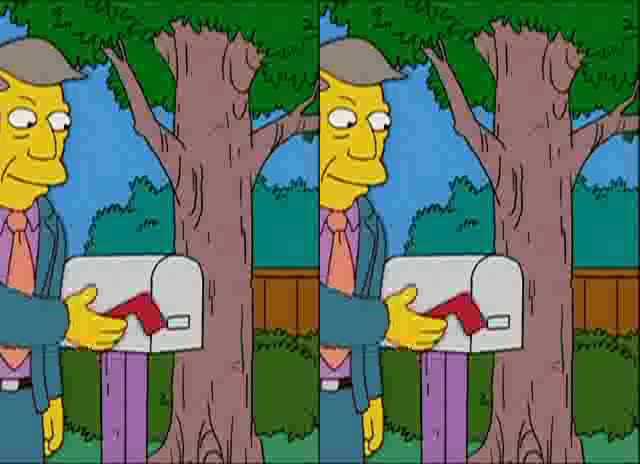

------------------------
F:  charles_montgomery_burns_pic_1047.jpg.png


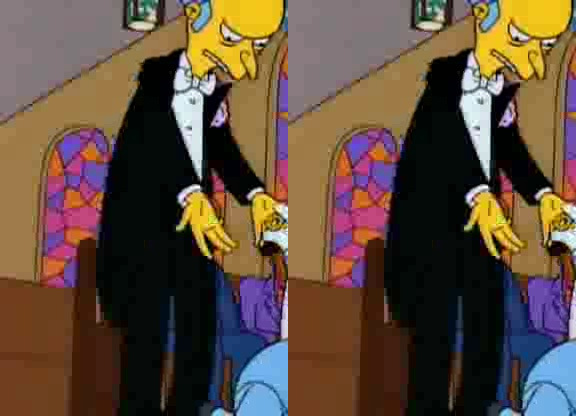

------------------------
F:  principal_skinner_pic_0114.jpg.png


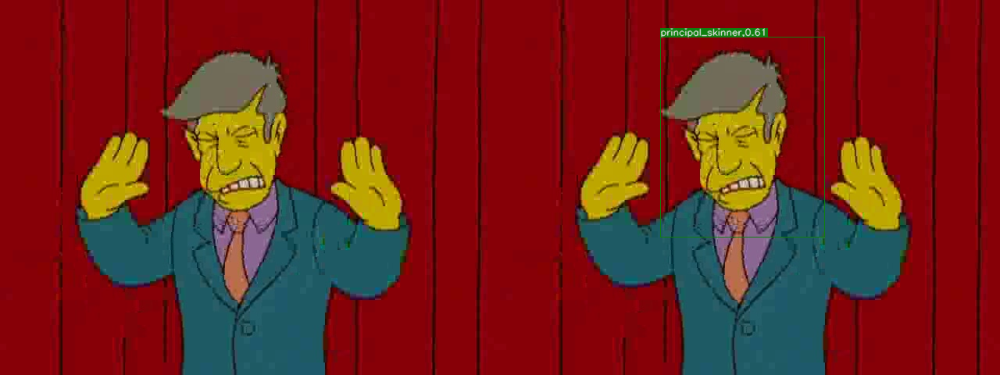

------------------------
F:  lisa_simpson_pic_0079.jpg.png


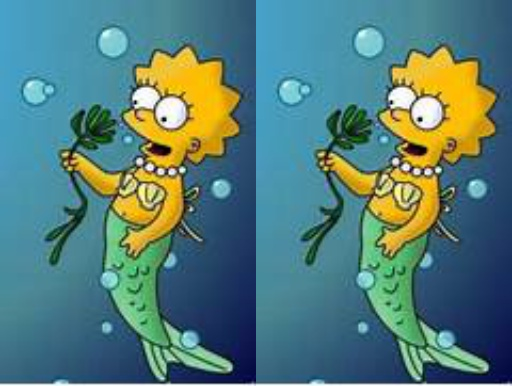

------------------------
F:  bart_simpson_pic_1037.jpg.png


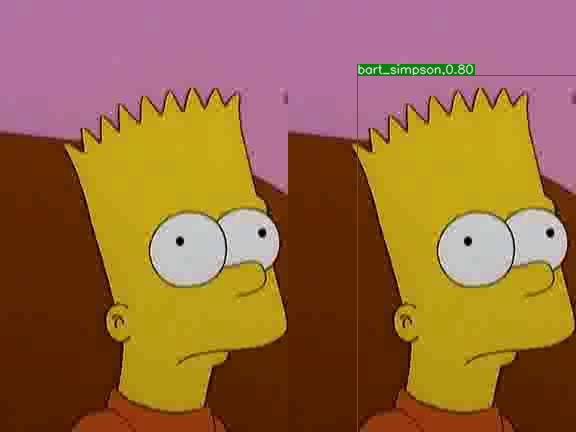

------------------------
F:  lisa_simpson_pic_1081.jpg.png


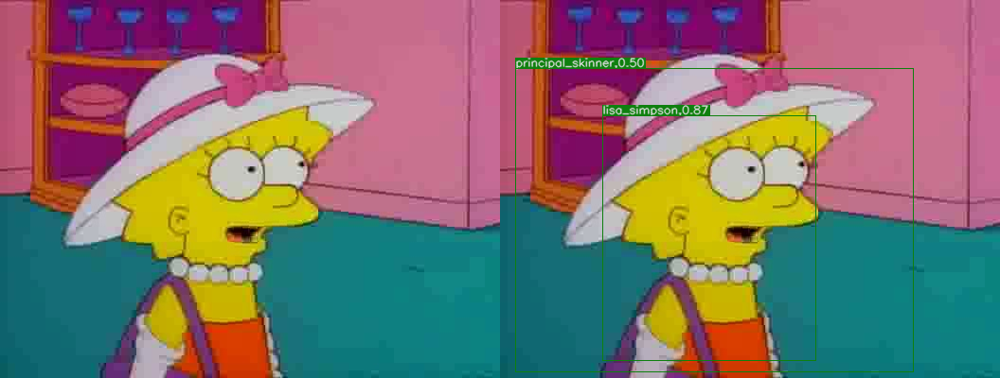

------------------------
F:  marge_simpson_pic_0203.jpg.png


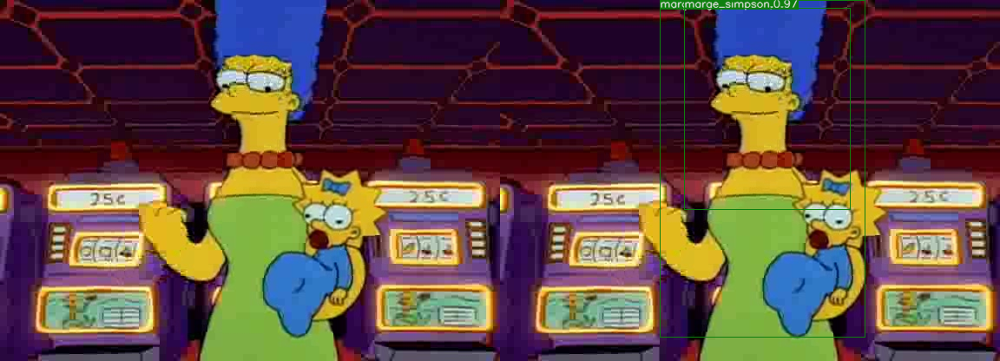

------------------------
F:  ned_flanders_pic_1151.jpg.png


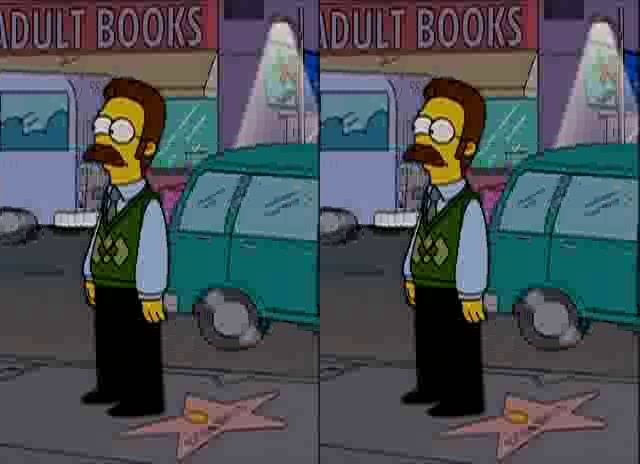

------------------------
F:  abraham_grampa_simpson_pic_0393.jpg.png


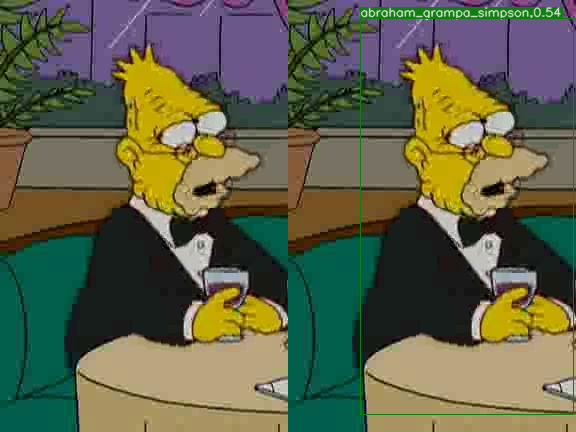

------------------------
F:  homer_simpson_pic_1368.jpg.png


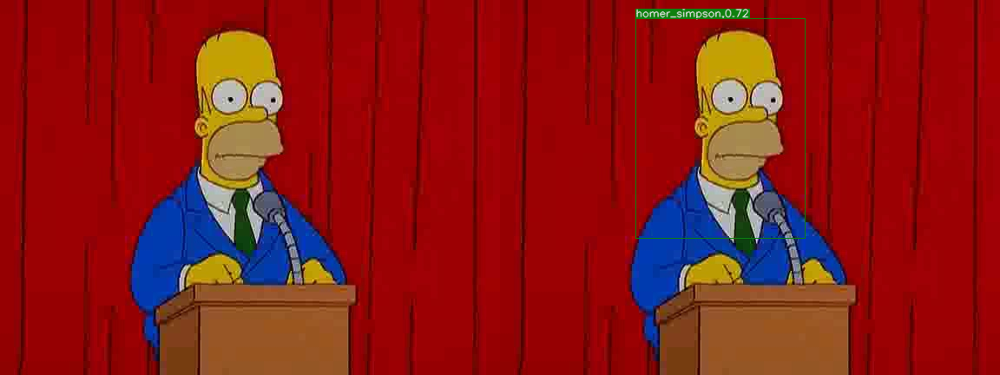

------------------------
F:  marge_simpson_pic_1047.jpg.png


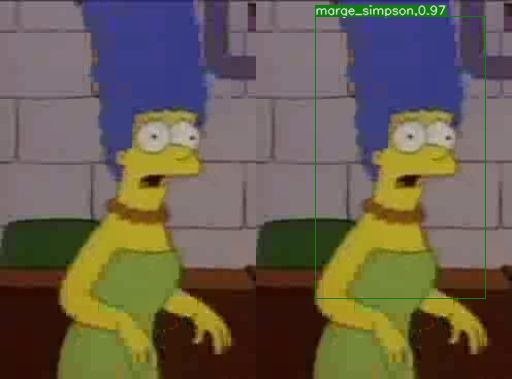

------------------------
F:  ned_flanders_pic_0064.jpg.png


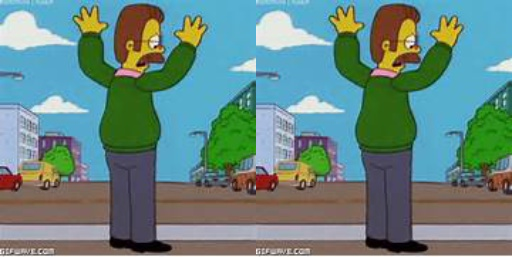

------------------------
F:  abraham_grampa_simpson_pic_0029.jpg.png


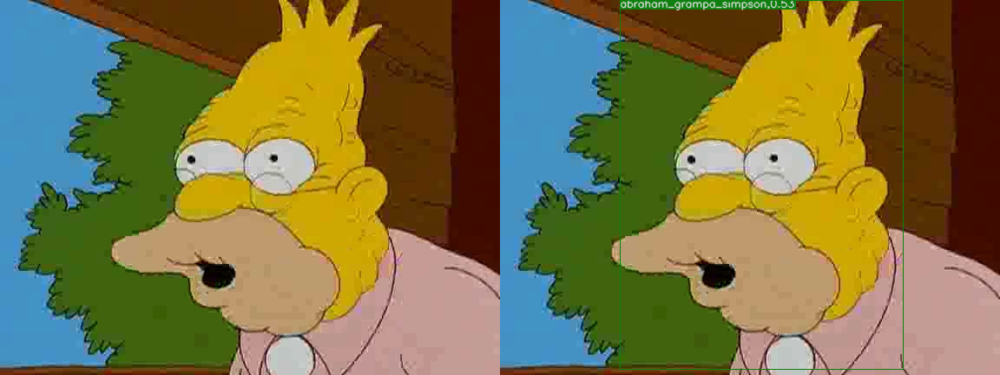

------------------------
F:  bart_simpson_pic_0871.jpg.png


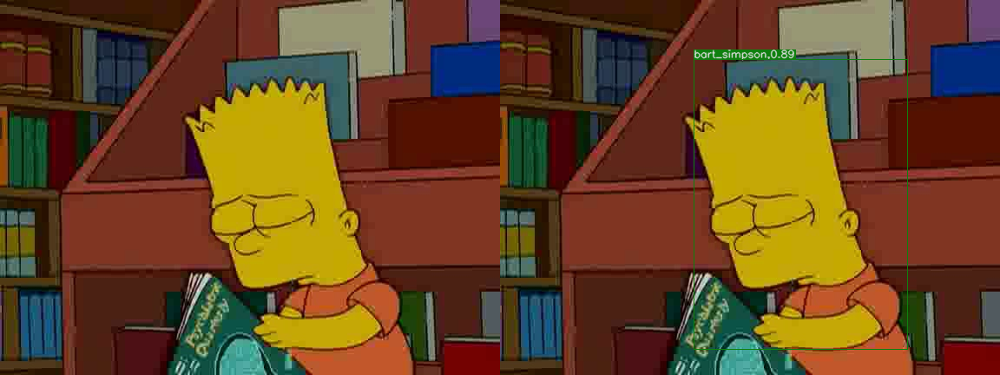

------------------------
F:  charles_montgomery_burns_pic_0640.jpg.png


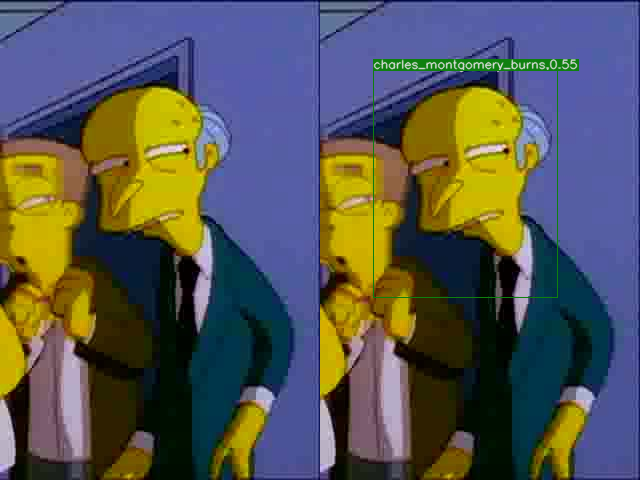

------------------------
F:  abraham_grampa_simpson_pic_0903.jpg.png


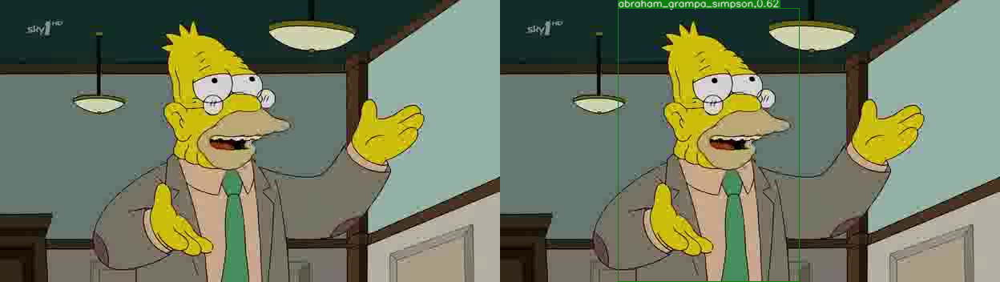

------------------------
F:  charles_montgomery_burns_pic_0527.jpg.png


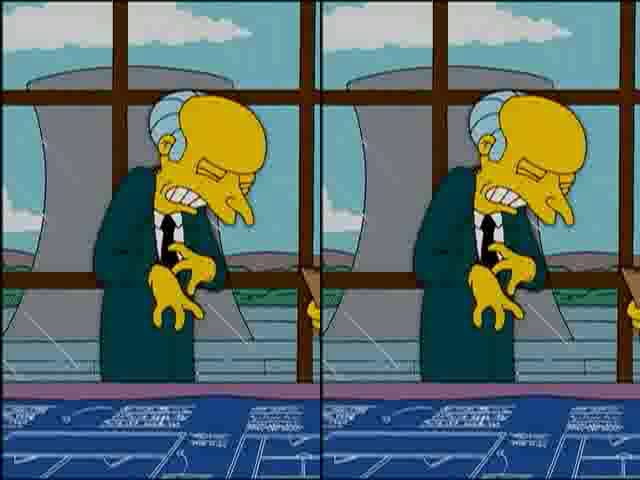

------------------------
F:  bart_simpson_pic_0097.jpg.png


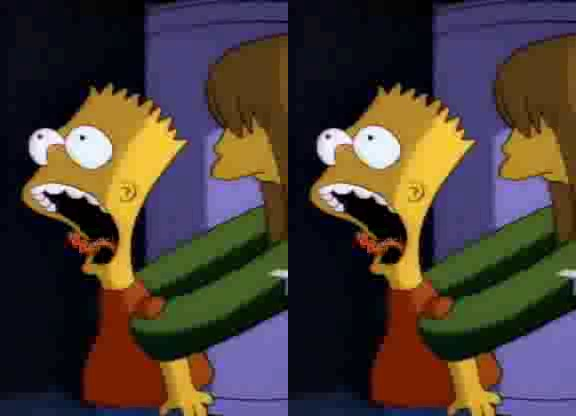

------------------------
F:  principal_skinner_pic_0699.jpg.png


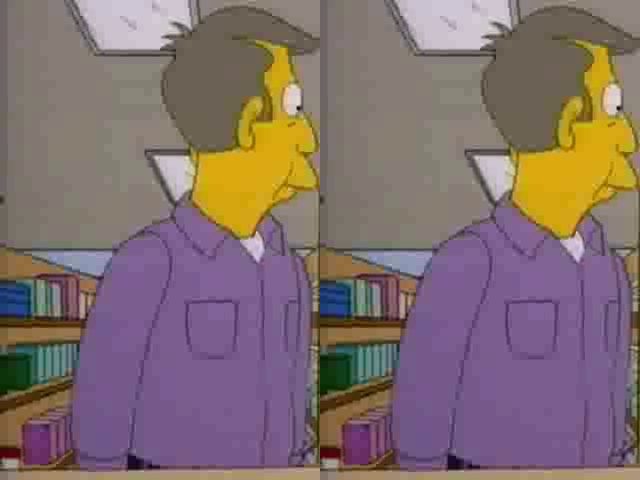

In [17]:

from IPython.display import Image, display
pred_out = './prediction'
for file in os.listdir(pred_out):
    print('------------------------')
    print('F: ', file)
    file_path = os.path.join(pred_out, file)
    display(Image(file_path))

In [18]:
# # # clean up
# !rm -r {pred_out}
# !rm -r {test_destination}

# Results conclusion

- We only trained 50% of the dataset, with 18 classes and only pass through the dataset once in this example
- Given the size of the dataset, our training is very "small" and not efficient enough to give a valuable/meaningful result. But still it demonstrated that the model did learn some recognition from the simpson dataset
- Note: training with sufficient training data is important, here 50% of data is "decent" but sometimes training will fail completely and do not produce any predictions at all.

# Notes

1. For more information/detailed notes and examples on how the transfer learning on simpson was implemented, refer to my example on [github](https://github.com/produdez/tensorpack-faster-rcnn) or specifically this [PR](https://github.com/produdez/tensorpack-faster-rcnn/pull/1) (Refer to `dataset/simpson.py` and `dataset/parse_simpson.py`)
3. The balloon example demonstrated on tensorpack's repo ([here](https://github.com/tensorpack/tensorpack/tree/master/examples/FasterRCNN)) is also very useful (refer to `balloon.md`, `dataset/balloon.py`, ...)
